In [2]:
!pip install opencv-python-headless==4.5.5.62
from IPython import get_ipython
from IPython.display import display

!pip install pybullet
import torch
from ultralytics import YOLO
import cv2
import pybullet as p
import pybullet_data
import numpy as np

In [3]:
# YOLO 모델 로드
model = YOLO('/content/drive/MyDrive/AIFFEL_2024/Q-FIT/test_December_31/result/yolov8_billiard/weights/best.pt')  # 학습 완료된 YOLO 모델

In [4]:
# PyBullet 초기화 함수
def init_physics_engine():
    """
    PyBullet 물리 엔진 초기화 및 설정.
    """
    p.connect(p.DIRECT)  # PyBullet 시뮬레이터를 초기화 (GUI 모드: GUI)
    p.setAdditionalSearchPath(pybullet_data.getDataPath())  # PyBullet 기본 데이터 경로 추가
    p.setGravity(0, 0, -9.8)  # 중력 설정
    p.loadURDF("plane.urdf")  # 평면 로드

In [5]:
# 물리 엔진 시뮬레이션 함수
def simulate_physics(detection_results, steps=50):
    """
    물리 엔진을 사용하여 경로 데이터를 계산합니다.
    :param detection_results: YOLO 검출 결과 리스트 [(x1, y1, x2, y2, confidence, class_id), ...]
    :param steps: 시뮬레이션 스텝 수
    :return: 경로 데이터 리스트
    """
    paths = []
    for obj in detection_results:
        x1, y1, x2, y2, confidence, class_id = obj
        center_x = (x1 + x2) / 2
        center_y = (y1 + y2) / 2

        # 객체 초기 속도 및 위치 설정 (2D를 3D에 매핑)
        start_pos = [center_x / 1000, center_y / 1000, 0.1]  # 3D 공간 상의 초기 위치
        velocity = [np.random.uniform(-1, 1), np.random.uniform(-1, 1), 0]  # 랜덤 초기 속도

        # 공 객체 생성
        ball_id = p.createCollisionShape(p.GEOM_SPHERE, radius=0.05)
        body_id = p.createMultiBody(baseMass=1, baseCollisionShapeIndex=ball_id, basePosition=start_pos)

        # 속도 설정
        p.resetBaseVelocity(body_id, linearVelocity=velocity)

        # 시뮬레이션 실행
        object_path = []
        for _ in range(steps):
            p.stepSimulation()
            pos, _ = p.getBasePositionAndOrientation(body_id)
            object_path.append((pos[0] * 1000, pos[1] * 1000))  # 경로를 2D 좌표로 변환

        paths.append({
            "class_id": class_id,
            "path": object_path
        })

    return paths

In [8]:
# 비디오에서 객체 검출 및 물리 엔진 활용
def process_video(video_path, output_path):
    """
    비디오에서 객체를 검출하고 물리 엔진을 사용하여 경로 데이터를 생성합니다.
    :param video_path: 입력 비디오 경로
    :param output_path: 출력 비디오 경로
    """
    init_physics_engine()  # PyBullet 초기화

    cap = cv2.VideoCapture(video_path)
    frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = int(cap.get(cv2.CAP_PROP_FPS))
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_path, fourcc, fps, (frame_width, frame_height))

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        # YOLO로 객체 검출
        results = model(frame)  # YOLO 모델의 결과
        detection_results = []
        for r in results:  # 결과는 Result 객체 리스트로 반환됩니다
            for box in r.boxes:  # 각 결과에서 박스 정보를 가져옵니다
                x1, y1, x2, y2 = box.xyxy[0]  # 좌표
                confidence = box.conf[0]      # 신뢰도
                class_id = box.cls[0]         # 클래스 ID
                detection_results.append((x1.item(), y1.item(), x2.item(), y2.item(), confidence.item(), int(class_id.item())))

        # 물리 엔진을 통한 경로 계산
        paths = simulate_physics(detection_results)

        # 시각화 및 결과 저장
        for path_info in paths:
            for point in path_info["path"]:
                cv2.circle(frame, (int(point[0]), int(point[1])), 3, (0, 255, 0), -1)

        out.write(frame)

        # Use cv2_imshow instead of cv2.imshow and remove cv2.waitKey
        from google.colab.patches import cv2_imshow
        cv2_imshow(frame)
        # if cv2.waitKey(1) & 0xFF == ord('q'): # Remove this line
        #     break # Remove this line

    cap.release()
    out.release()
    cv2.destroyAllWindows()
    p.disconnect()  # PyBullet 연결 종료


0: 736x1280 1 frame, 2 red balls, 1 table, 1 white ball, 1 yellow ball, 1406.0ms
Speed: 11.2ms preprocess, 1406.0ms inference, 1.4ms postprocess per image at shape (1, 3, 736, 1280)


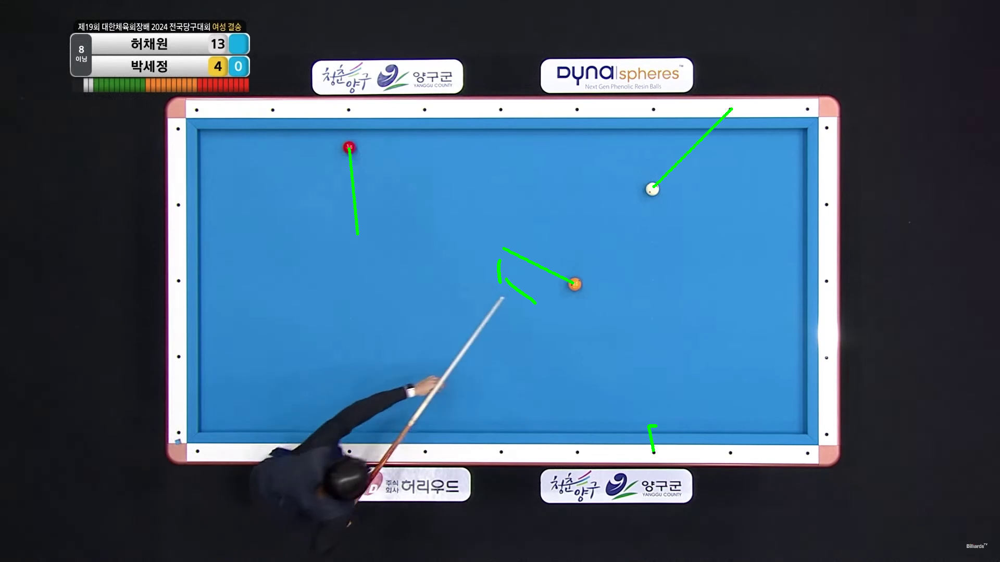


0: 736x1280 1 frame, 2 red balls, 1 table, 1 white ball, 1 yellow ball, 1914.7ms
Speed: 13.0ms preprocess, 1914.7ms inference, 1.6ms postprocess per image at shape (1, 3, 736, 1280)


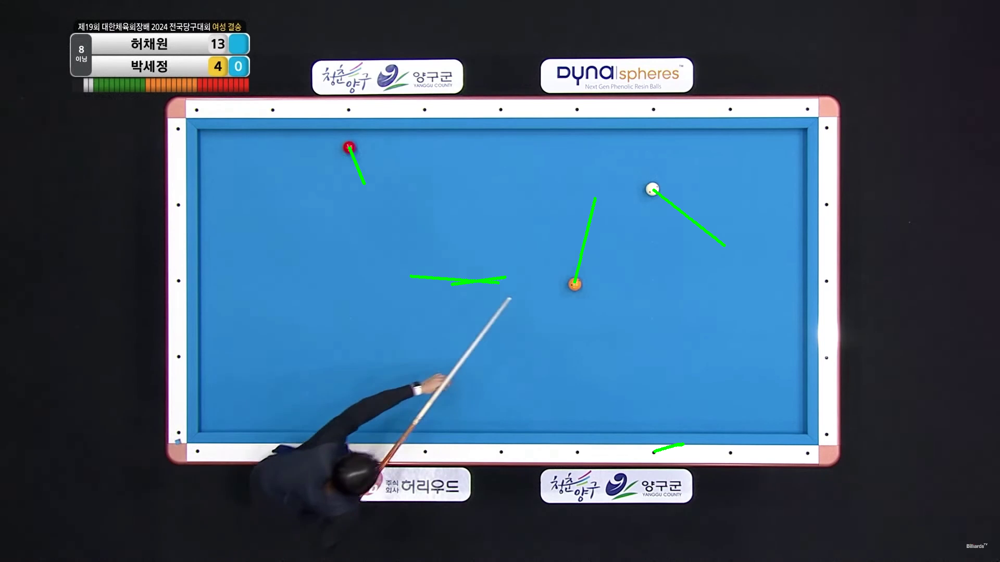


0: 736x1280 1 frame, 2 red balls, 1 table, 1 white ball, 1 yellow ball, 1494.5ms
Speed: 12.2ms preprocess, 1494.5ms inference, 1.3ms postprocess per image at shape (1, 3, 736, 1280)


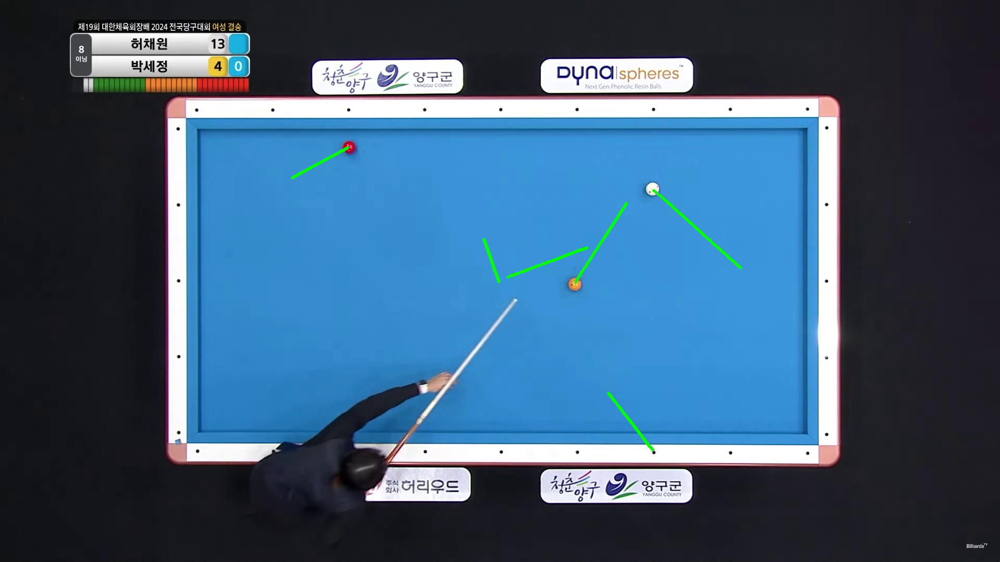


0: 736x1280 1 frame, 3 red balls, 1 table, 1 white ball, 1 yellow ball, 1511.5ms
Speed: 21.8ms preprocess, 1511.5ms inference, 1.5ms postprocess per image at shape (1, 3, 736, 1280)


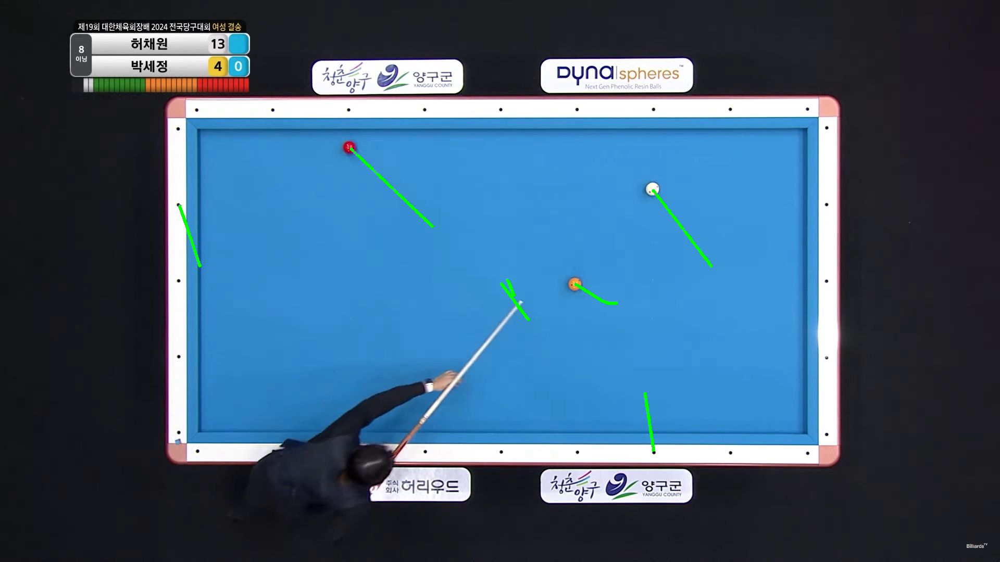


0: 736x1280 1 frame, 3 red balls, 1 table, 1 white ball, 1 yellow ball, 2275.4ms
Speed: 30.0ms preprocess, 2275.4ms inference, 2.0ms postprocess per image at shape (1, 3, 736, 1280)


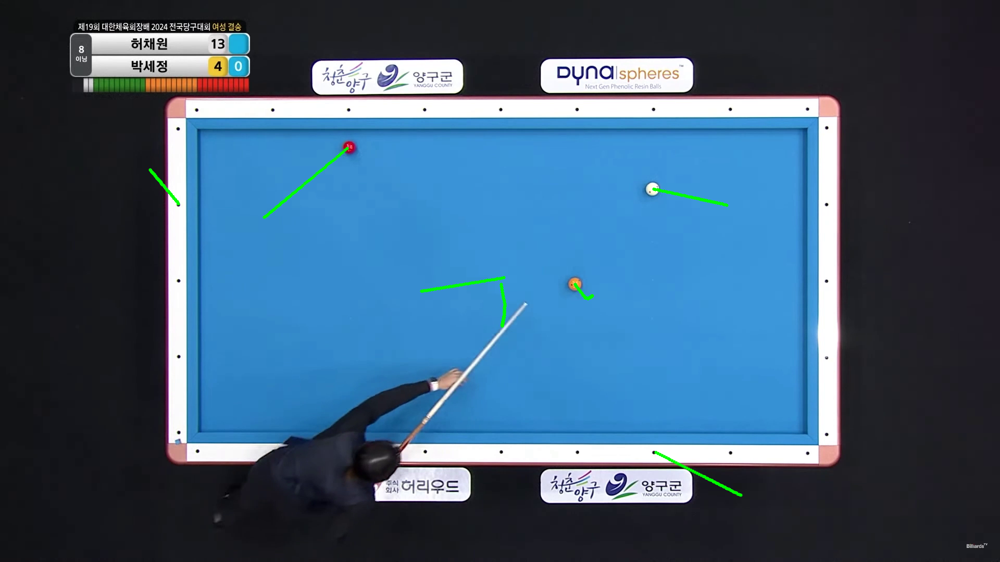


0: 736x1280 1 frame, 3 red balls, 1 table, 1 white ball, 1 yellow ball, 1731.3ms
Speed: 12.9ms preprocess, 1731.3ms inference, 1.4ms postprocess per image at shape (1, 3, 736, 1280)


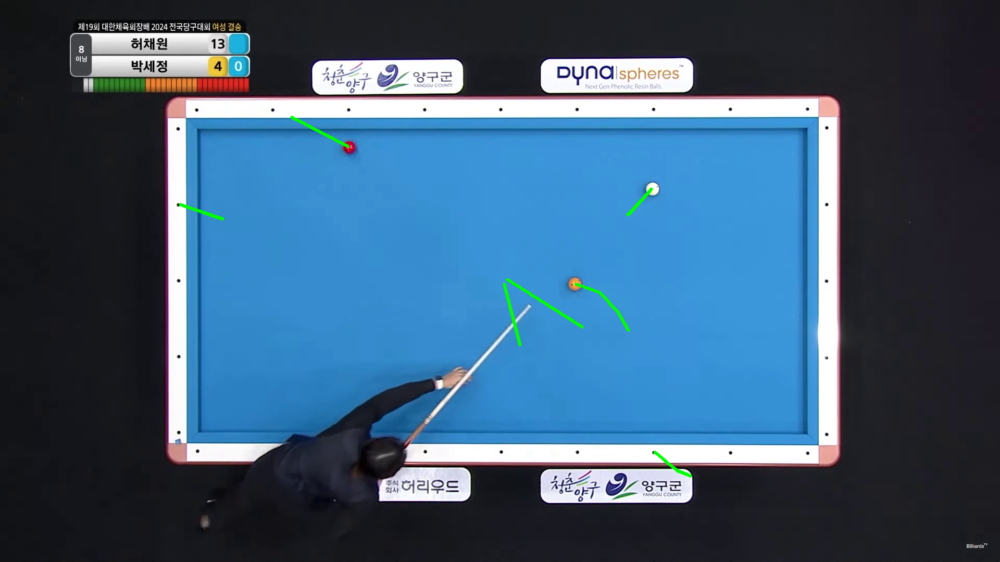


0: 736x1280 1 frame, 3 red balls, 1 table, 1 white ball, 1 yellow ball, 2036.6ms
Speed: 35.4ms preprocess, 2036.6ms inference, 1.8ms postprocess per image at shape (1, 3, 736, 1280)


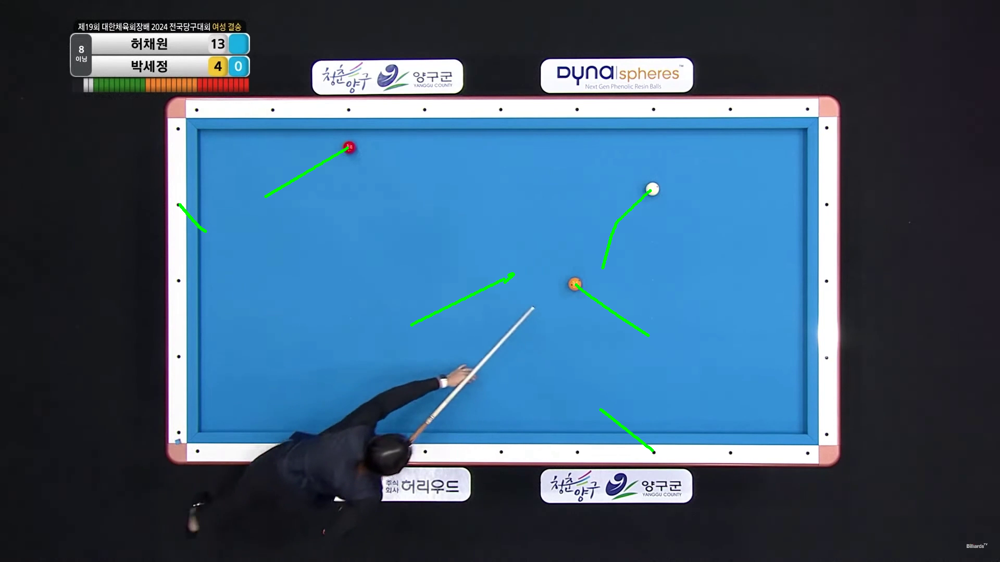


0: 736x1280 1 frame, 3 red balls, 1 table, 1 white ball, 1 yellow ball, 1531.5ms
Speed: 13.5ms preprocess, 1531.5ms inference, 7.9ms postprocess per image at shape (1, 3, 736, 1280)


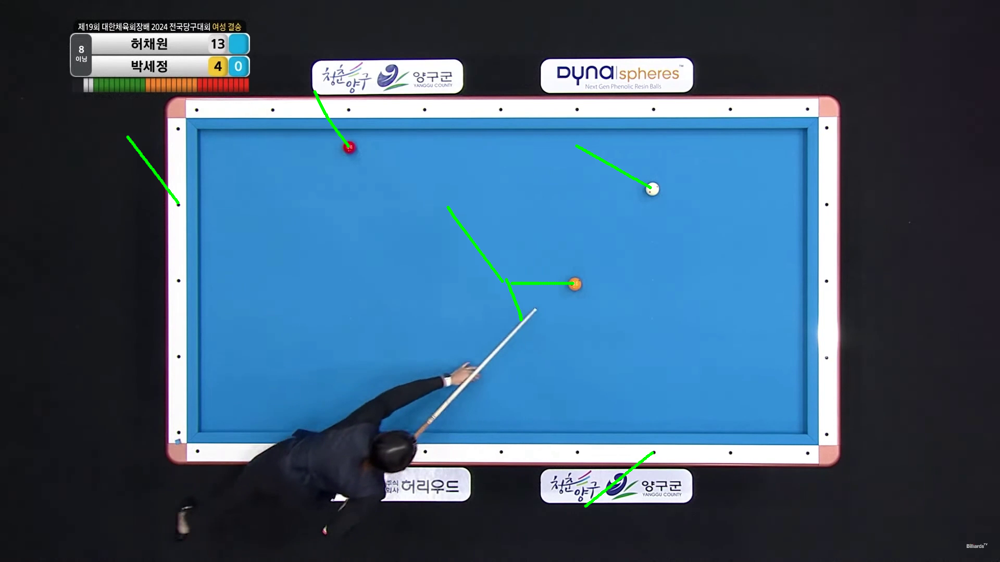


0: 736x1280 1 frame, 3 red balls, 1 table, 1 white ball, 1 yellow ball, 1600.8ms
Speed: 20.0ms preprocess, 1600.8ms inference, 1.4ms postprocess per image at shape (1, 3, 736, 1280)


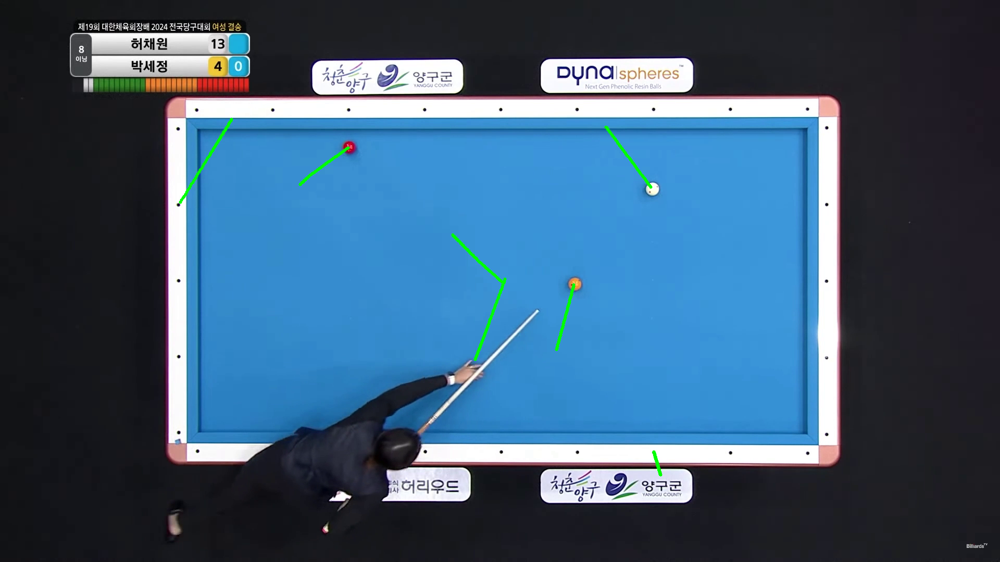


0: 736x1280 1 frame, 3 red balls, 1 table, 1 white ball, 1 yellow ball, 1578.7ms
Speed: 12.5ms preprocess, 1578.7ms inference, 1.2ms postprocess per image at shape (1, 3, 736, 1280)


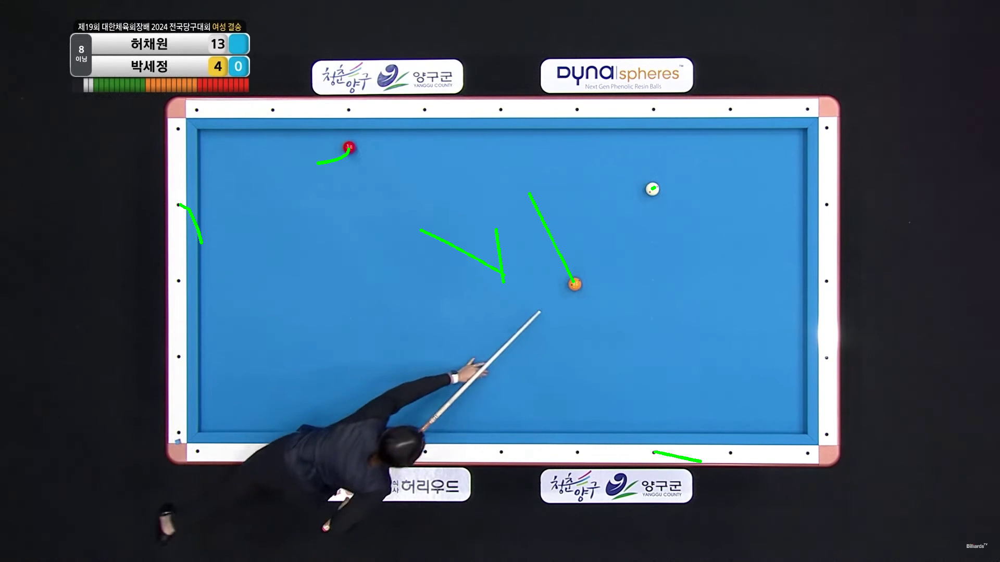


0: 736x1280 1 frame, 3 red balls, 1 table, 1 white ball, 1 yellow ball, 1514.0ms
Speed: 16.1ms preprocess, 1514.0ms inference, 1.2ms postprocess per image at shape (1, 3, 736, 1280)


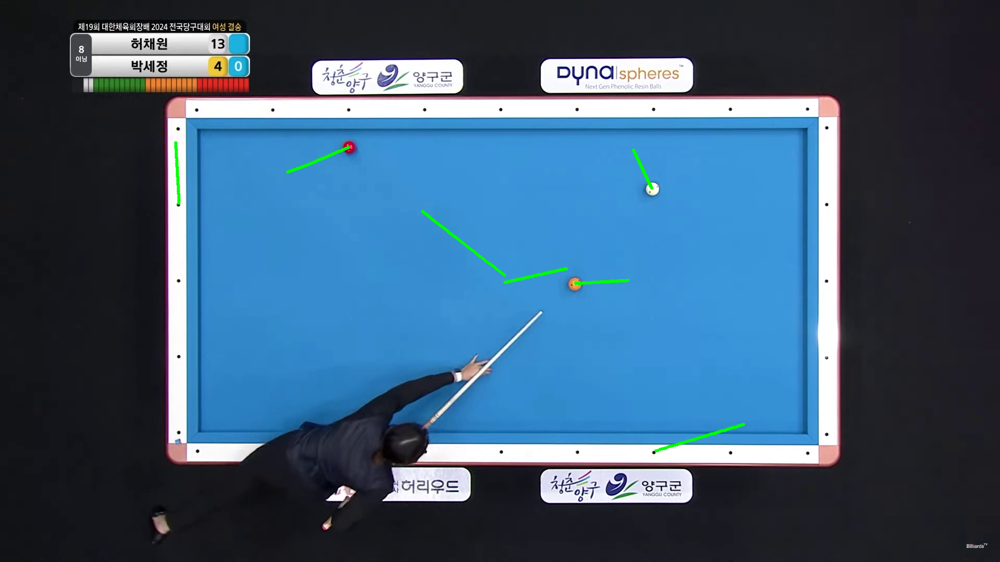


0: 736x1280 1 frame, 3 red balls, 1 table, 1 white ball, 1 yellow ball, 1667.2ms
Speed: 20.7ms preprocess, 1667.2ms inference, 1.7ms postprocess per image at shape (1, 3, 736, 1280)


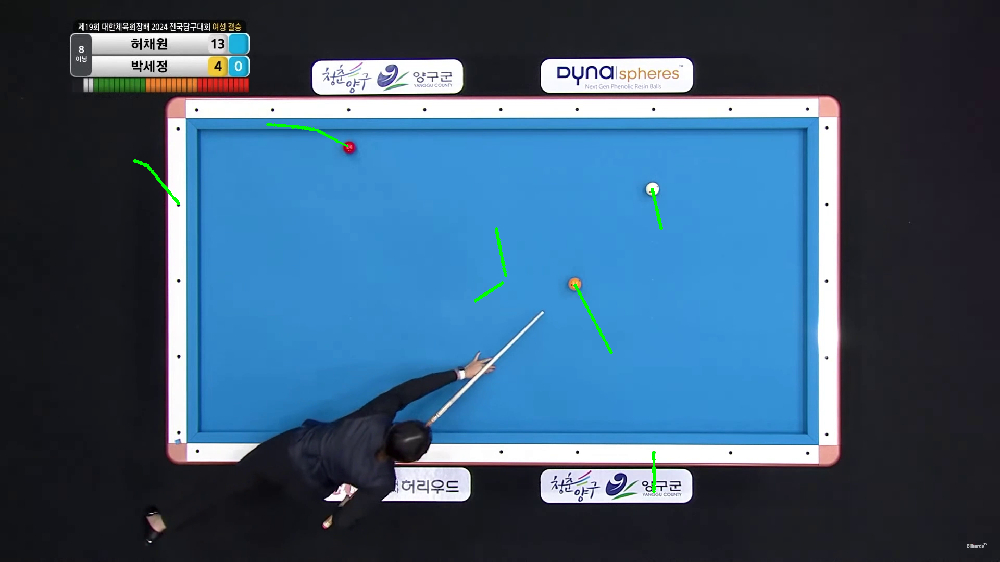


0: 736x1280 1 frame, 3 red balls, 1 table, 1 white ball, 1 yellow ball, 1534.1ms
Speed: 13.3ms preprocess, 1534.1ms inference, 1.2ms postprocess per image at shape (1, 3, 736, 1280)


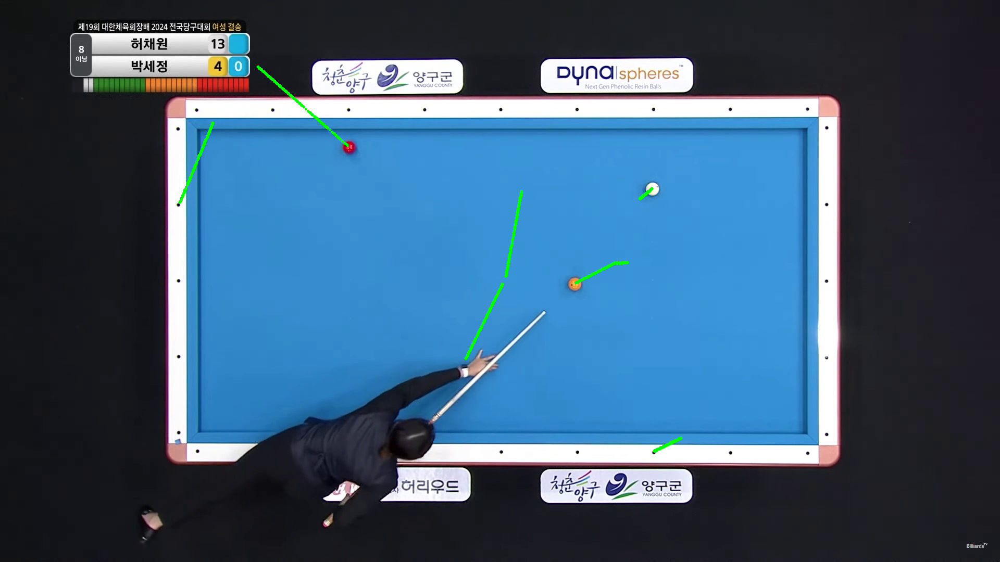


0: 736x1280 1 frame, 4 red balls, 1 table, 1 white ball, 1 yellow ball, 1962.7ms
Speed: 17.9ms preprocess, 1962.7ms inference, 1.1ms postprocess per image at shape (1, 3, 736, 1280)


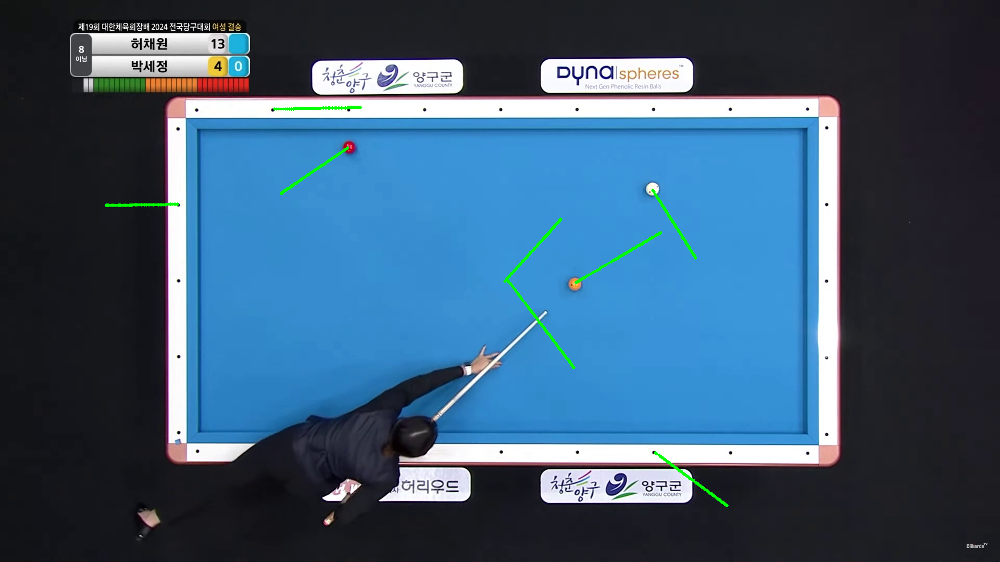


0: 736x1280 1 frame, 4 red balls, 1 table, 1 white ball, 1 yellow ball, 1669.9ms
Speed: 12.5ms preprocess, 1669.9ms inference, 1.1ms postprocess per image at shape (1, 3, 736, 1280)


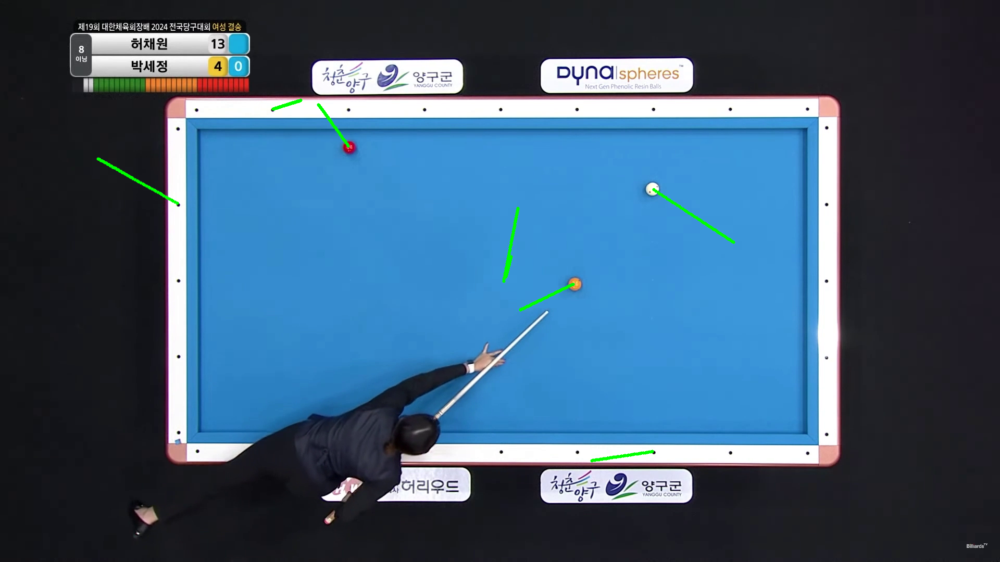


0: 736x1280 1 frame, 4 red balls, 1 table, 1 white ball, 1 yellow ball, 1605.3ms
Speed: 20.4ms preprocess, 1605.3ms inference, 1.6ms postprocess per image at shape (1, 3, 736, 1280)


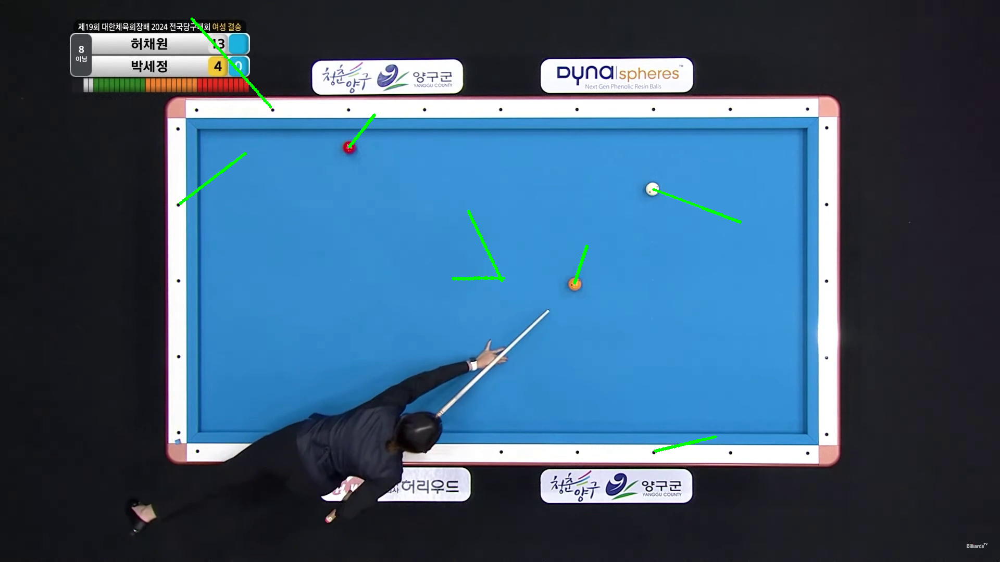


0: 736x1280 1 frame, 4 red balls, 1 table, 1 white ball, 1 yellow ball, 1626.7ms
Speed: 25.4ms preprocess, 1626.7ms inference, 1.2ms postprocess per image at shape (1, 3, 736, 1280)


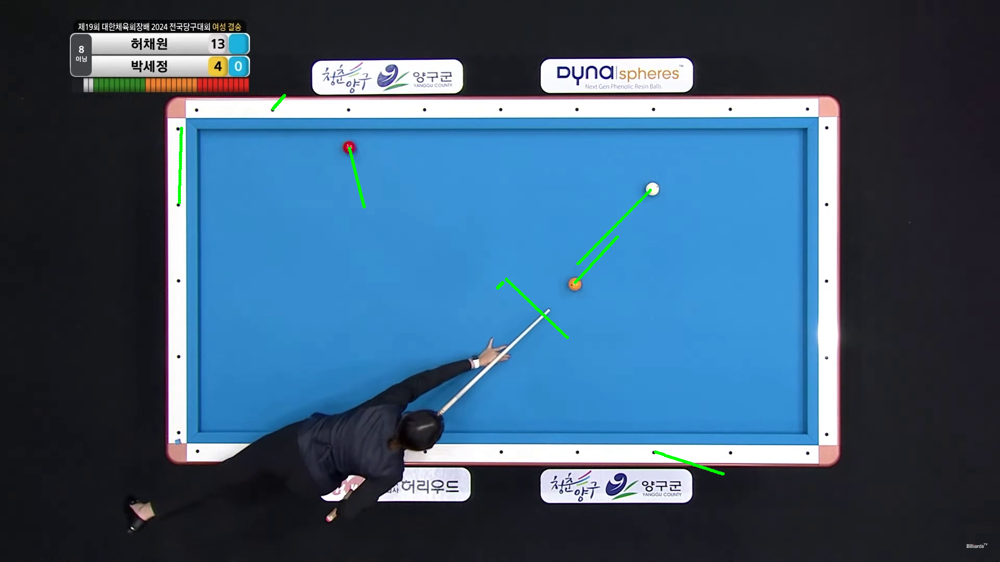


0: 736x1280 1 frame, 3 red balls, 1 table, 1 white ball, 1 yellow ball, 1650.0ms
Speed: 13.5ms preprocess, 1650.0ms inference, 1.2ms postprocess per image at shape (1, 3, 736, 1280)


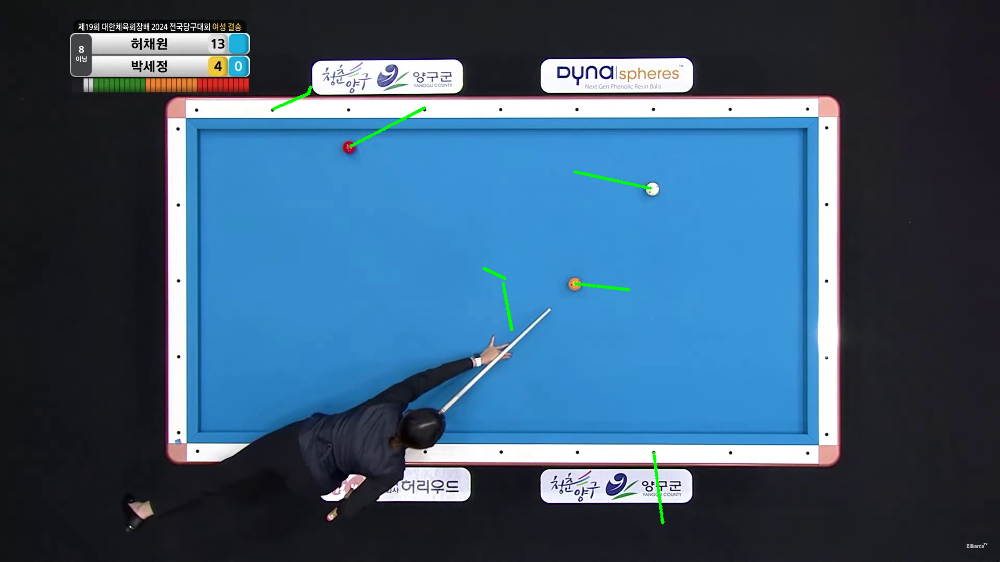


0: 736x1280 1 frame, 3 red balls, 1 table, 1 white ball, 1 yellow ball, 1776.1ms
Speed: 21.9ms preprocess, 1776.1ms inference, 1.1ms postprocess per image at shape (1, 3, 736, 1280)


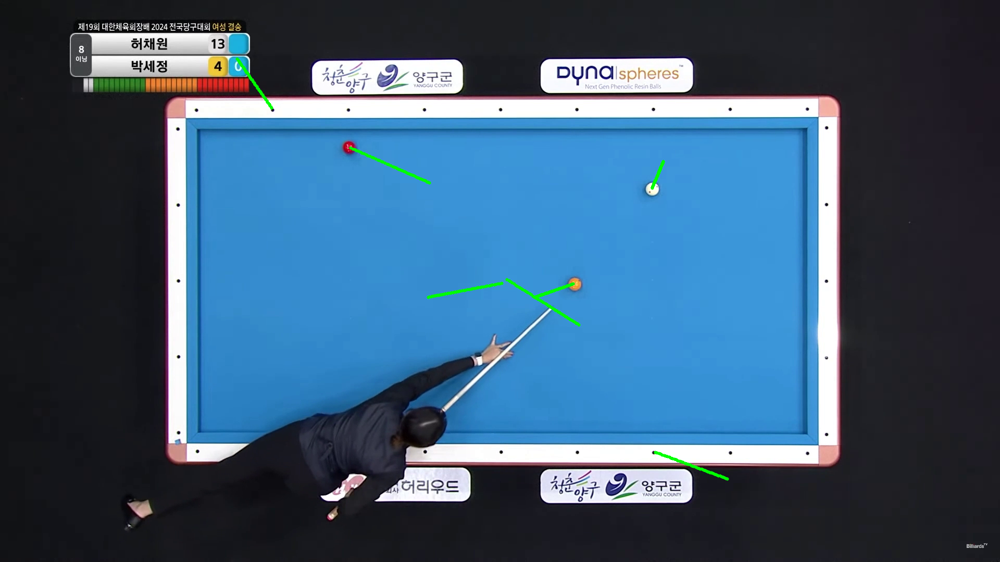


0: 736x1280 1 frame, 3 red balls, 1 table, 1 white ball, 1 yellow ball, 1634.6ms
Speed: 13.0ms preprocess, 1634.6ms inference, 3.0ms postprocess per image at shape (1, 3, 736, 1280)


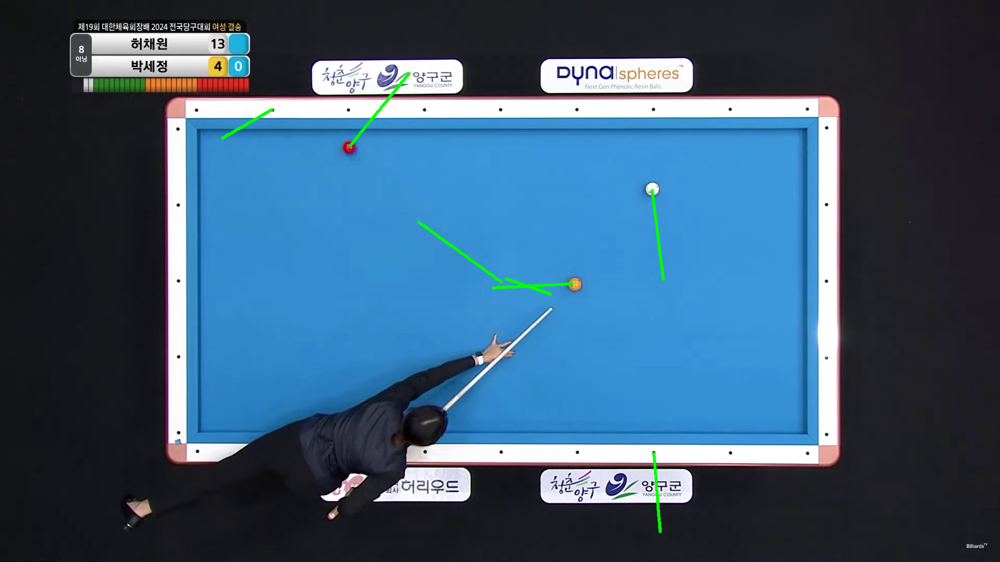


0: 736x1280 1 frame, 3 red balls, 1 table, 1 white ball, 1 yellow ball, 1827.6ms
Speed: 19.0ms preprocess, 1827.6ms inference, 1.5ms postprocess per image at shape (1, 3, 736, 1280)


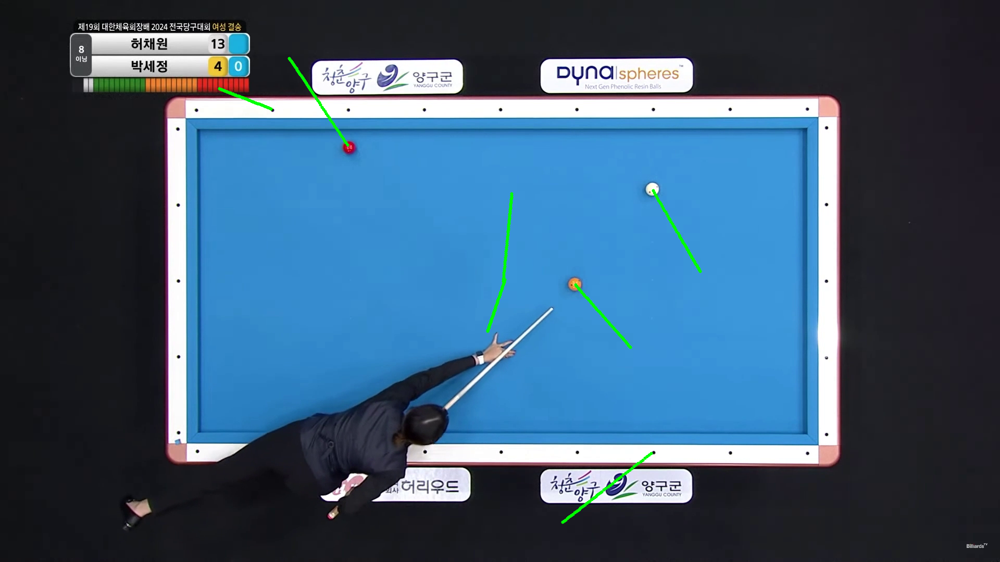


0: 736x1280 1 frame, 3 red balls, 1 table, 1 white ball, 1 yellow ball, 1660.0ms
Speed: 16.4ms preprocess, 1660.0ms inference, 1.1ms postprocess per image at shape (1, 3, 736, 1280)


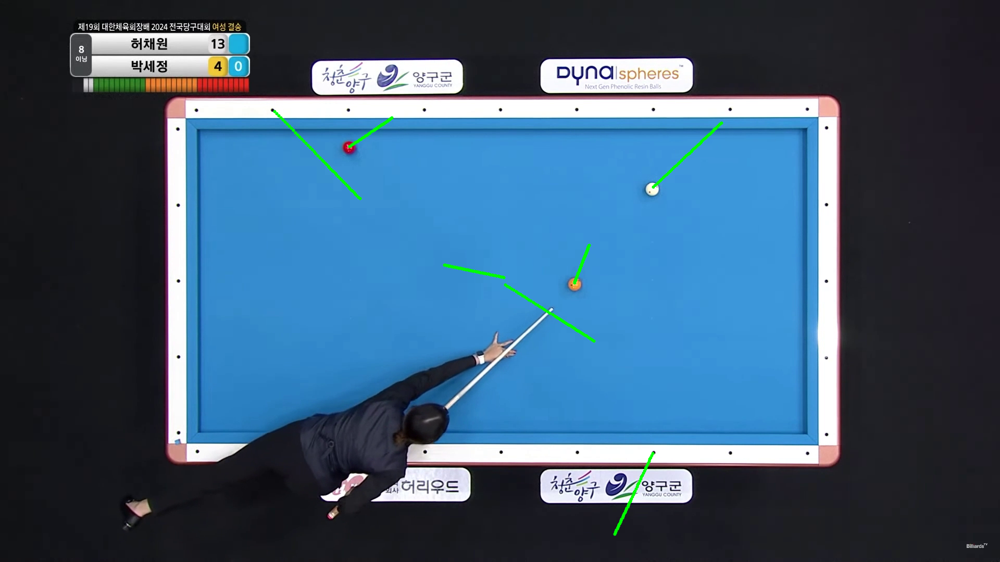

KeyboardInterrupt: 

In [11]:
# 실행 예시
input_video = '/content/drive/MyDrive/AIFFEL_2024/Q-FIT/pre_aiffelthon_practice/practice.mp4'  # 입력 비디오 경로
output_video = '/content/drive/MyDrive/AIFFEL_2024/Q-FIT/test_December_31/result_2/output_practice.mp4'  # 출력 비디오 경로
process_video(input_video, output_video)